# LEVEL 1

# TASK 1

## Task: Data Exploration and Preprocessing

#### 1 . Explore the dataset and identify the number of rows and columns.

In [1]:
# import important Libraries
import os
import io
import pandas as pd
import numpy as np
import requests

In [2]:
# URL to the raw CSV file 
url = "https://raw.githubusercontent.com/preethiakshai/Cog_intership/main/Dataset%20.csv"

# Read the CSV file
try:
    data = pd.read_csv(url, on_bad_lines='skip')  # Skipping bad lines if there are any issues
    print(data.head())  # Display the first few rows to ensure it loaded correctly
except pd.errors.ParserError as e:
    print(f"ParserError: {e}")


   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [3]:
data.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [4]:
x=data.shape
print("Number of colums is equal to",x[1])
print("Number of rows is equal to ",x[0])

Number of colums is equal to 21
Number of rows is equal to  9551


In [5]:
data.columns.tolist()

['Restaurant ID',
 'Restaurant Name',
 'Country Code',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Longitude',
 'Latitude',
 'Cuisines',
 'Average Cost for two',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Price range',
 'Aggregate rating',
 'Rating color',
 'Rating text',
 'Votes']

### Check for missing values in each column and handle them accordingly.

In [6]:
data.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [7]:
# Identify rows with missing values in 'Cuisines' column
missing_cuisines_count = data['Cuisines'].isnull().sum()
print(f"Number of rows with missing 'Cuisines': {missing_cuisines_count}")

Number of rows with missing 'Cuisines': 9


In [8]:
data['Cuisines'].describe()

count             9542
unique            1825
top       North Indian
freq               936
Name: Cuisines, dtype: object

In [9]:
#Calculate the mode of the 'Cuisines' column
cuisines_mode = data['Cuisines'].mode()[0]
print(f"Mode of 'Cuisines': {cuisines_mode}")


Mode of 'Cuisines': North Indian


In [10]:
# Replace missing values with the mode
data['Cuisines'].fillna(cuisines_mode, inplace=True)



In [11]:
# Verify the missing values are handled
print(data.isnull().sum())


Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


#### Perform data type conversion if necessary. Analyze the distribution of the target variable("Aggregate rating") and identify any class imbalances

In [12]:
# Display data types of each column
print("\nData types of each column:")
print(data.dtypes)


Data types of each column:
Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


In [13]:
data['Has Table booking'].unique()

array(['Yes', 'No'], dtype=object)

In [14]:
data['Has Online delivery'].unique()

array(['No', 'Yes'], dtype=object)

In [15]:
data['Is delivering now'].unique()

array(['No', 'Yes'], dtype=object)

In [16]:
data['Switch to order menu'].unique()

array(['No'], dtype=object)

In [17]:
data['Aggregate rating'].unique()

array([4.8, 4.5, 4.4, 4.9, 4. , 4.2, 4.3, 3.6, 4.7, 3. , 3.8, 3.7, 3.2,
       3.1, 0. , 4.1, 3.3, 4.6, 3.9, 3.4, 3.5, 2.2, 2.9, 2.4, 2.6, 2.8,
       2.1, 2.7, 2.5, 1.8, 2. , 2.3, 1.9])

In [18]:
# Convert 'Yes'/'No' columns to binary (0/1)
binary_columns = ['Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu']
for col in binary_columns:
    data[col] = data[col].map({'Yes': 1, 'No': 0}).astype(int)

In [19]:
# check for the data type change
data.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking         int32
Has Online delivery       int32
Is delivering now         int32
Switch to order menu      int32
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

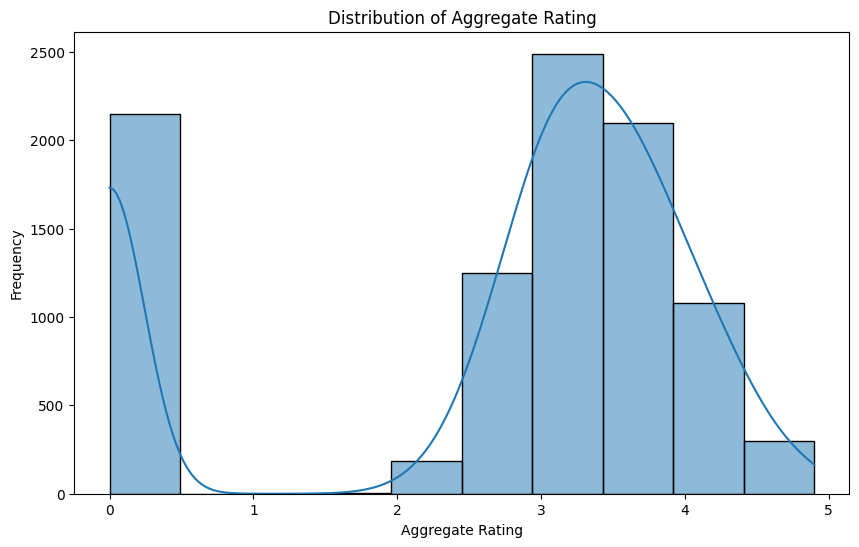

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
# Plot the distribution of 'Aggregate rating'
plt.figure(figsize=(10, 6))
sns.histplot(data['Aggregate rating'], bins=10, kde=True)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

In [21]:
# Check the value counts for 'Aggregate rating'
rating_counts = data['Aggregate rating'].value_counts().sort_index()
print("\nValue counts of 'Aggregate rating':")
print(rating_counts)




Value counts of 'Aggregate rating':
Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64


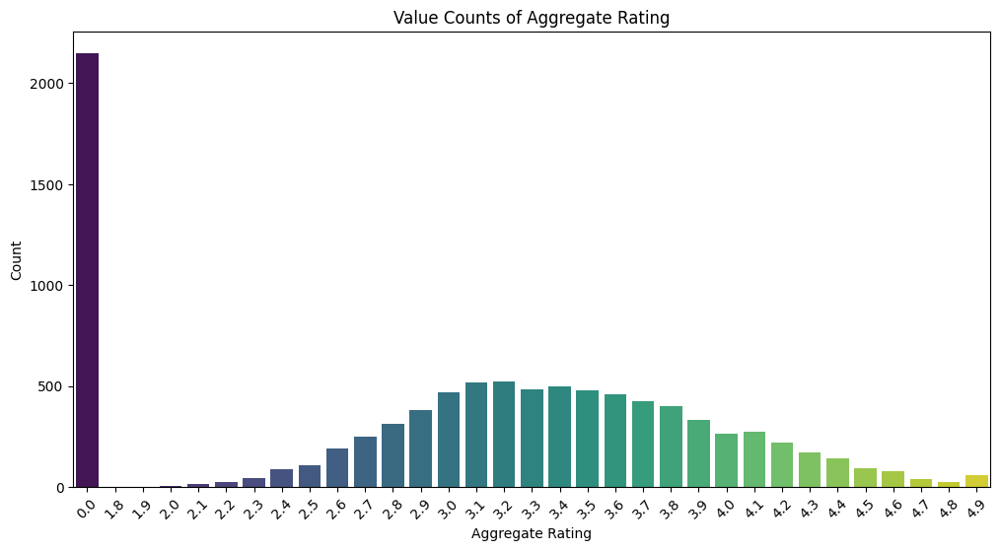

In [22]:
# Plot the value counts for 'Aggregate rating'
plt.figure(figsize=(12, 6))
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='viridis')
plt.title('Value Counts of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()



In [23]:
# Identify class imbalances
# A simple threshold to identify imbalance could be if any class has significantly more or fewer counts than the others
imbalance_threshold = rating_counts.mean() + rating_counts.std()
imbalanced_classes = rating_counts[rating_counts > imbalance_threshold].index.tolist()

print(f"\nImbalanced classes: {imbalanced_classes}")


Imbalanced classes: [0.0]


## TASK 2

#### Task:  Descriptive Analysis
 Calculate basic statistical measures (mean,
 median, standard deviation, etc.) for numerical
 columns.
 Explore the distribution of categorical
 variables like "Country Code," "City," and
 "Cuisines."
 Identify the top cuisines and cities with the
 highest number of restaurants.


1. Calculate Basic Statistical Measures

In [24]:
# Basic statistical measures for numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns
statistics = data[numerical_columns].describe()

print("Basic statistical measures for numerical columns:")
print(statistics)

Basic statistical measures for numerical columns:
       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000 

2. Explore the Distribution of Categorical Variables

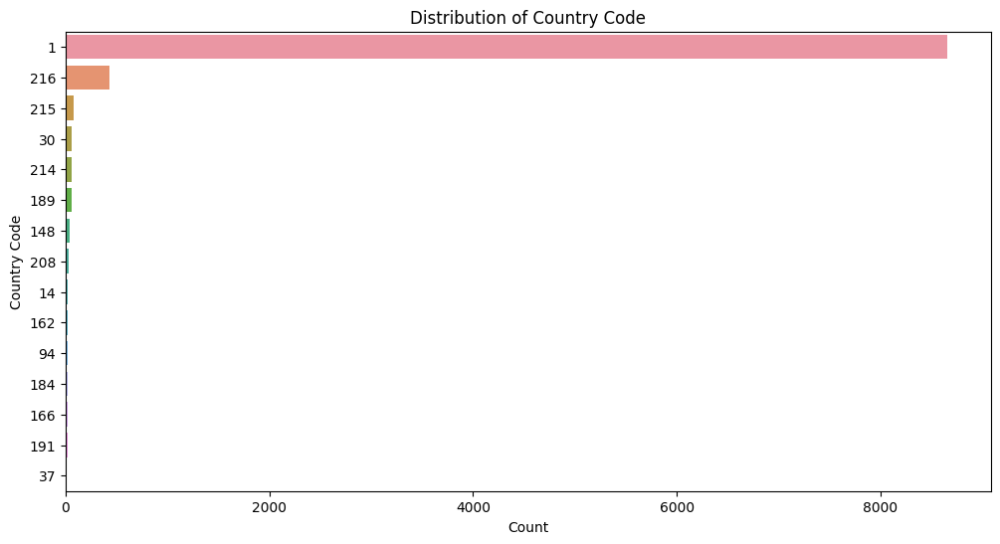

In [25]:
# Plot the distribution of 'Country Code'
plt.figure(figsize=(12, 6))
sns.countplot(y='Country Code', data=data, order=data['Country Code'].value_counts().index)
plt.title('Distribution of Country Code')
plt.xlabel('Count')
plt.ylabel('Country Code')
plt.show()

In [26]:
# Filter cities with more than 20 restaurants
top_cities = data['City'].value_counts()
top_cities_20 = top_cities[top_cities > 20].index

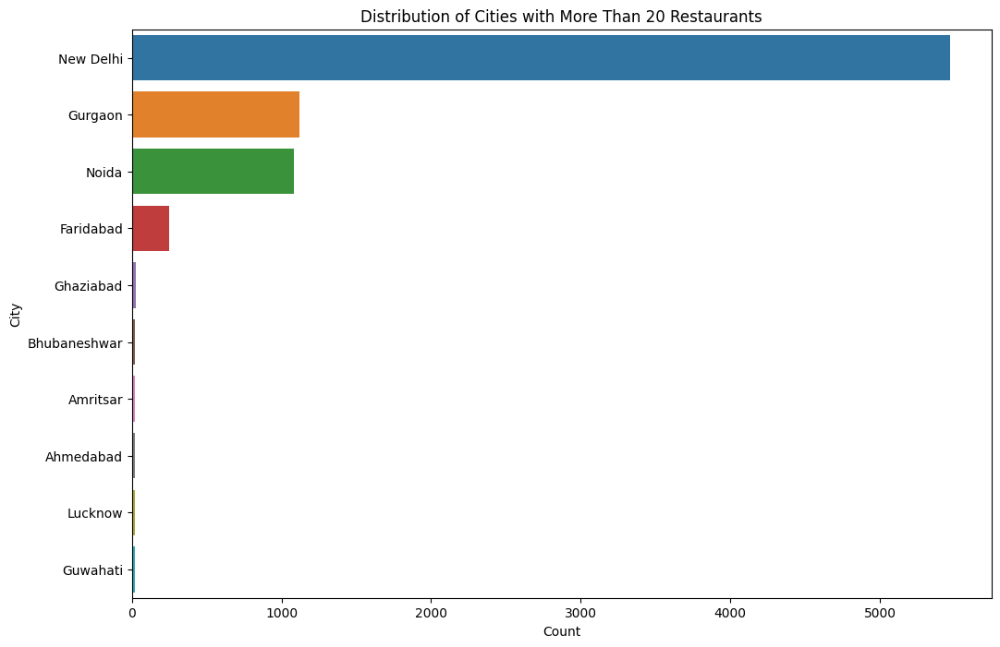

In [27]:


# Plot the distribution of these filtered cities
plt.figure(figsize=(12, 8))
sns.countplot(y='City', data=data[data['City'].isin(top_cities_20)], order=top_cities_20)
plt.title('Distribution of Cities with More Than 20 Restaurants')
plt.xlabel('Count')
plt.ylabel('City')
plt.show()


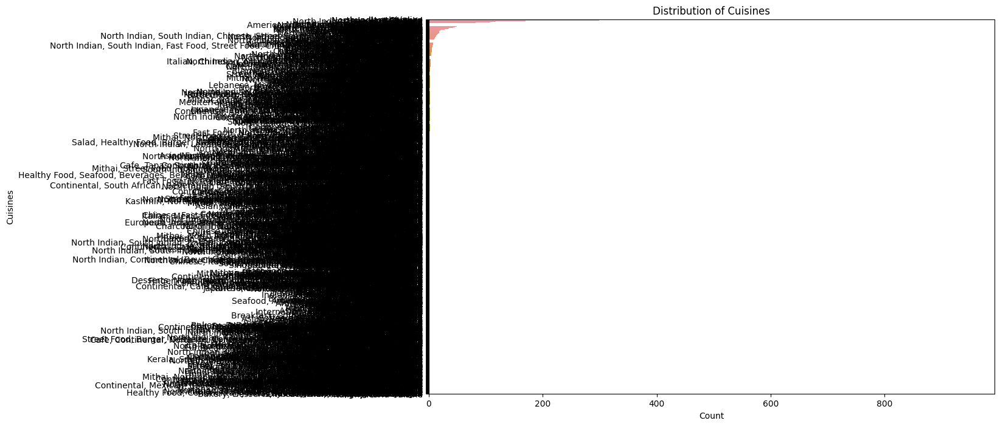

In [28]:
# Plot the distribution of 'Cuisines'
plt.figure(figsize=(12, 8))
sns.countplot(y='Cuisines', data=data, order=data['Cuisines'].value_counts().index)
plt.title('Distribution of Cuisines')
plt.xlabel('Count')
plt.ylabel('Cuisines')
plt.show()



In [29]:
# Top cuisines with the highest number of restaurants
top_cuisines = data['Cuisines'].value_counts().head(10)
print("\nTop 10 cuisines with the highest number of restaurants:")
print(top_cuisines)




Top 10 cuisines with the highest number of restaurants:
Cuisines
North Indian                      945
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


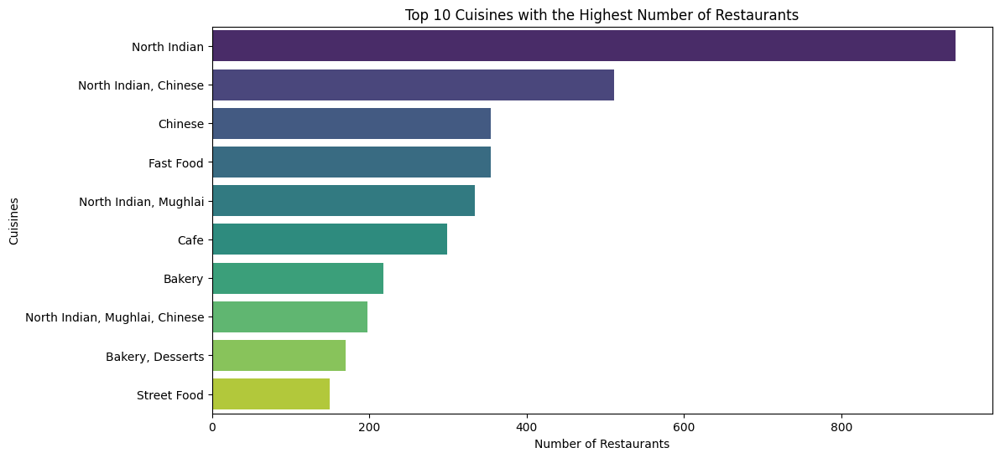


Top 10 cities with the highest number of restaurants:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


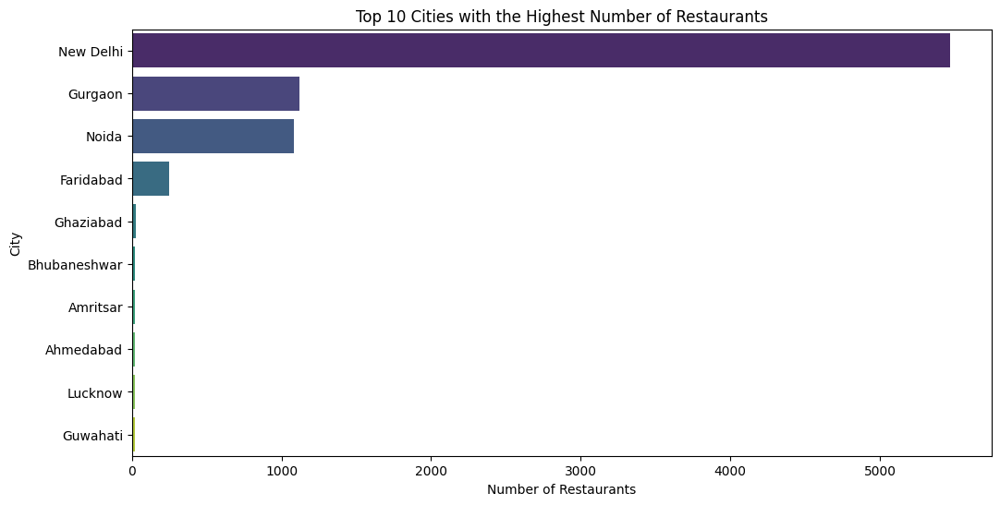

In [30]:
# Plot the top cuisines
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cuisines.values, y=top_cuisines.index, palette='viridis')
plt.title('Top 10 Cuisines with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('Cuisines')
plt.show()

# Top cities with the highest number of restaurants
top_cities = data['City'].value_counts().head(10)
print("\nTop 10 cities with the highest number of restaurants:")
print(top_cities)

# Plot the top cities
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cities.values, y=top_cities.index, palette='viridis')
plt.title('Top 10 Cities with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()


In [31]:
# Top cities with the highest number of restaurants
top_cities = data['City'].value_counts().head(10)
print("\nTop 10 cities with the highest number of restaurants:")
print(top_cities)




Top 10 cities with the highest number of restaurants:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


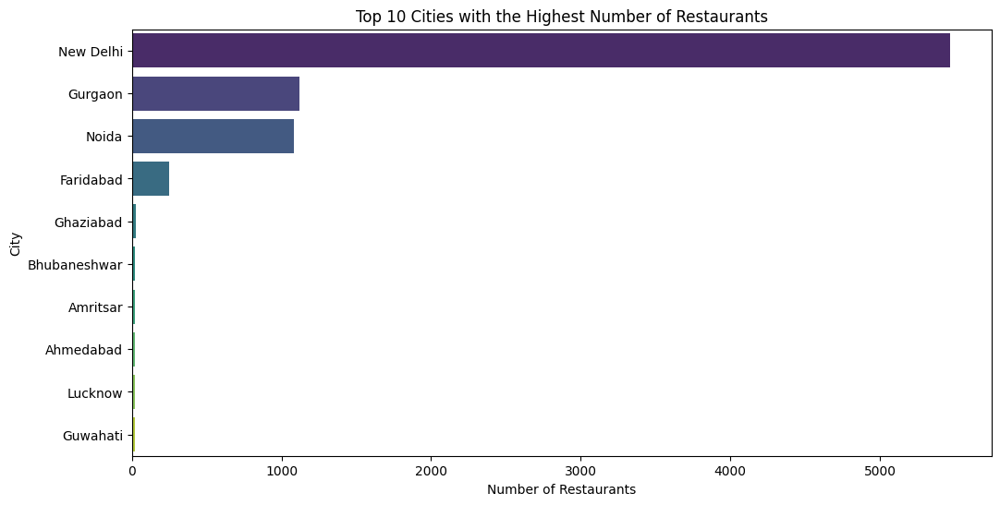

In [32]:
# Plot the top cities
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cities.values, y=top_cities.index, palette='viridis')
plt.title('Top 10 Cities with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

 # Task:  Geospatial Analysis
 ## Task 3
 1. Visualize the locations of restaurants on a map using latitude and longitude information.
 2. Analyze the distribution of restaurants across different cities or countries.
 3. Determine if there is any correlation between the restaurant's location and its rating

In [34]:
import folium
from folium.plugins import MarkerCluster

# Create a base map

map_ = folium.Map(location=[20.5937, 78.9629], zoom_start=5)  # Centered around India



In [35]:
# Add marker cluster to the map
marker_cluster = MarkerCluster().add_to(map_)

# Add markers to the cluster
for idx, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Restaurant: {row['Restaurant Name']}\nRating: {row['Aggregate rating']}",
    ).add_to(marker_cluster)

# Save the map to an HTML file
map_.save("restaurant_locations.html")

# Display the map
map_

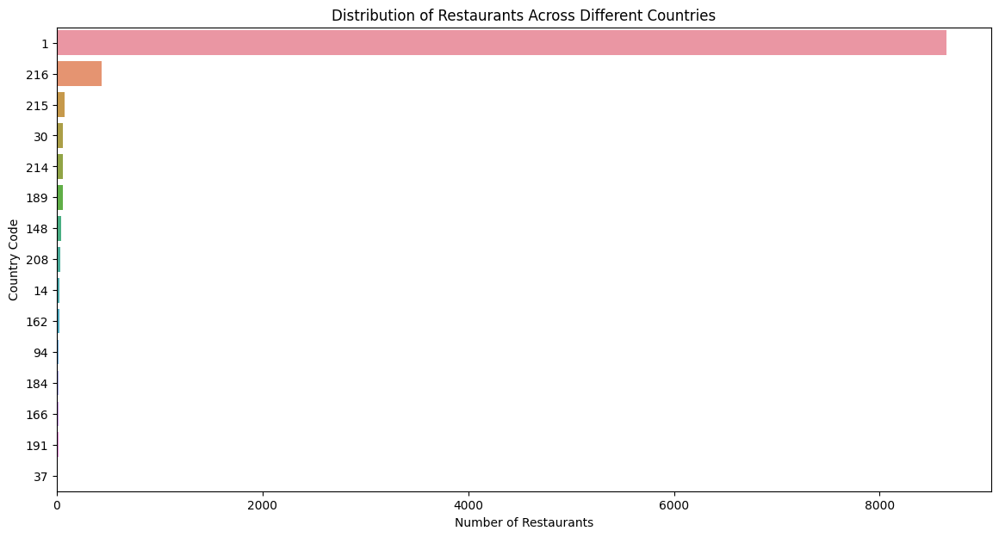

In [38]:
# Plot the distribution of restaurants across different countries
plt.figure(figsize=(14, 7))
sns.countplot(y='Country Code', data=data, order=data['Country Code'].value_counts().index)
plt.title('Distribution of Restaurants Across Different Countries')
plt.xlabel('Number of Restaurants')
plt.ylabel('Country Code')
plt.show()

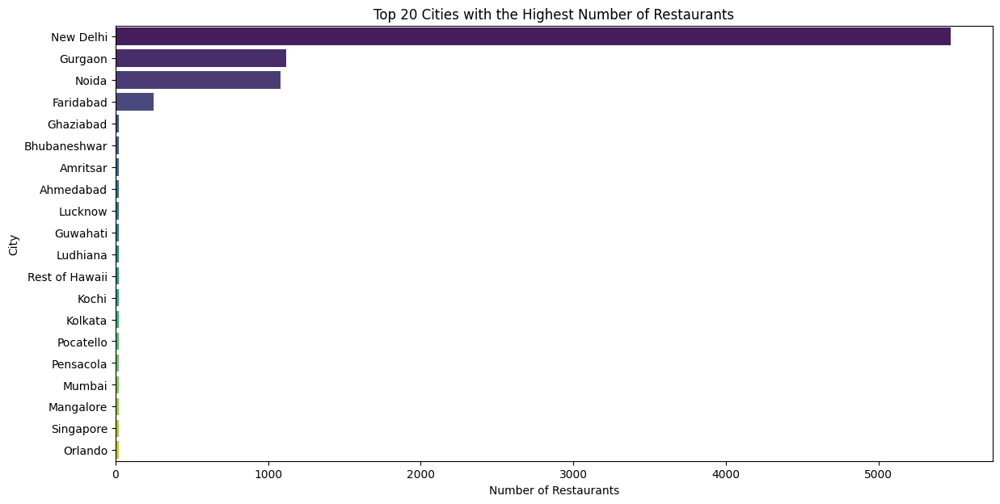

In [39]:
# Plot the distribution of restaurants across different cities
top_cities = data['City'].value_counts().head(20)  # Top 20 cities
plt.figure(figsize=(14, 7))
sns.barplot(x=top_cities.values, y=top_cities.index, palette='viridis')
plt.title('Top 20 Cities with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

In [43]:
# Calculate the correlation between latitude, longitude, and rating
correlation_matrix = data[['Latitude', 'Longitude', 'Aggregate rating']].corr()

print("Correlation matrix:")
print(correlation_matrix)



Correlation matrix:
                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


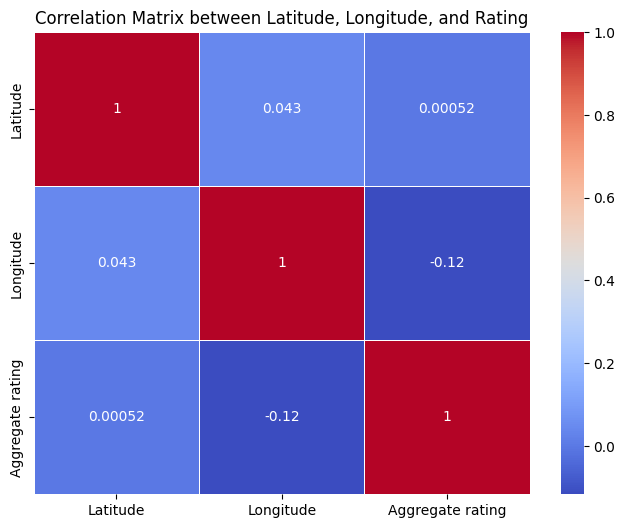

In [44]:
# Visualize the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix between Latitude, Longitude, and Rating')
plt.show()



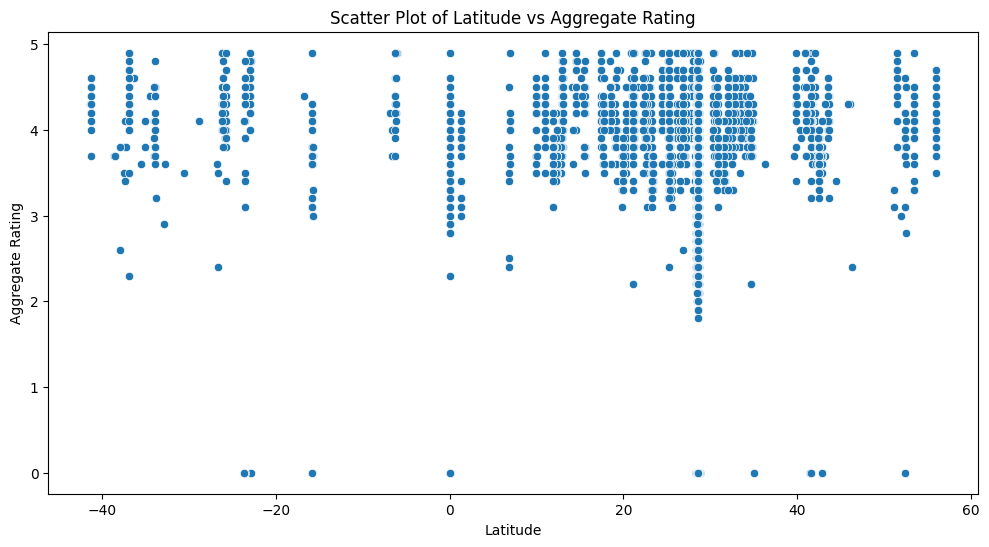

In [45]:
# Scatter plot for Latitude vs Aggregate Rating
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Latitude', y='Aggregate rating', data=data)
plt.title('Scatter Plot of Latitude vs Aggregate Rating')
plt.xlabel('Latitude')
plt.ylabel('Aggregate Rating')
plt.show()



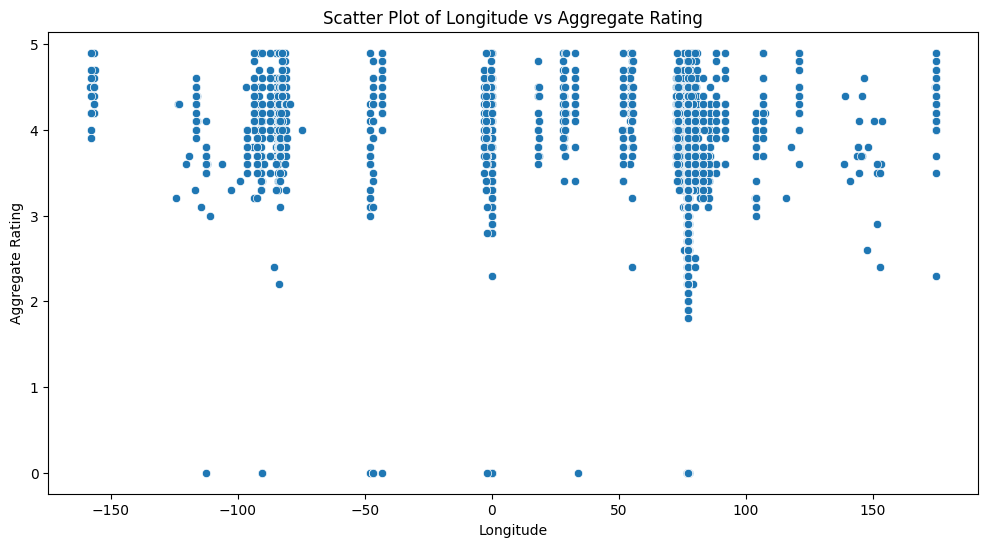

In [46]:
# Scatter plot for Longitude vs Aggregate Rating
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Longitude', y='Aggregate rating', data=data)
plt.title('Scatter Plot of Longitude vs Aggregate Rating')
plt.xlabel('Longitude')
plt.ylabel('Aggregate Rating')
plt.show()

The correlation matrix indicates that there is no significant linear relationship between the geographical coordinates (latitude and longitude) and the aggregate ratings. The weak correlations imply that other factors beyond just geographical location are likely influencing the aggregate ratings. 